In [1]:
import jax.numpy as np
from jax import jit, grad, vmap
import numpy as onp
import meshzoo
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm_notebook

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Draw

from scipy.spatial.distance import cdist

RDKit WARNING: [12:52:37] Enabling RDKit 2019.09.2 jupyter extensions


In [2]:
def golden_spiral(num_pts, radius):
    if radius==0:
        return np.array([[0,0,0]])
    indices = np.arange(0, num_pts) + 0.5
    phi = np.arccos(1 - 2*indices/num_pts)
    theta = np.pi * (1 + 5**0.5) * indices
    x, y, z = np.cos(theta) * np.sin(phi), np.sin(theta) * np.sin(phi), np.cos(phi);
    points = np.vstack([x,y,z]).T
    return points*radius

def plotly_scatter(pointsets, sizes=None, opacity=0.8):
    data = []
    #sizes = [np.ones(len(p))*s for p,s in zip(pointsets,sizes)]
    for p, s in zip(pointsets, sizes):
        a,b,c = p[:,0], p[:,1], p[:,2]
        markerparams=dict(size=s,sizemode='area',opacity=opacity)
        trace = go.Scatter3d(x=a, y=b, z=c, mode='markers', marker=markerparams)
        data.append(trace)
    layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0})
    plot_figure = go.Figure(data=data, layout=layout)
    plotly.offline.iplot(plot_figure)

In [3]:
radius_lookup = {}
radius_lookup['C']=1.7
radius_lookup[6]=1.7

radius_lookup['H']=1.0
radius_lookup[1]=1.0

radius_lookup['N']=1.625
radius_lookup[7]=1.625

radius_lookup['O']=1.49
radius_lookup[8]=1.49

radius_lookup['S']=1.782
radius_lookup[16]=1.782

# Set up the molecule:

In [4]:
mol = Chem.MolFromSmiles('CCCCCC1=CC(=C2C3C=C(CCC3C(OC2=C1)(C)C)C)O')
mol = Chem.AddHs(mol)
AllChem.EmbedMolecule(mol)
conf = mol.GetConformer()
#Get coordinates
atom_centres = np.array([list(conf.GetAtomPosition(int(i))) for i in range(mol.GetNumAtoms())])
#put at COM:
atom_centres = (atom_centres - np.mean(atom_centres,0))

#get radius from either rdkit (bad) or amber (good)
#radii = np.array([Chem.GetPeriodicTable().GetRvdw(a.GetAtomicNum()) for a in mol.GetAtoms()])
radii = np.array([radius_lookup[i.GetAtomicNum()] for i in mol.GetAtoms()])

/Users/lmar3213/miniconda3/envs/lew_jax/lib/python3.8/site-packages/jax/lib/xla_bridge.py:120: UserWarning:

No GPU/TPU found, falling back to CPU.



In [5]:
@jit
def E_fn(points1, points2):
    ri = np.expand_dims(points1, 0)
    rj = np.expand_dims(points2, 1)
    dxdydz = np.power(ri - rj, 2)
    dij = np.sqrt(np.sum(dxdydz, axis=-1))
    return dij


@jit
def get_atom_fraction(i, radii, sphere_points, atom_centres):
    translated_sphere_points = sphere_points*radii[i]+atom_centres[i]
    distance_to_all_atoms = E_fn(translated_sphere_points, atom_centres)
    nearest_atoms = distance_to_all_atoms.argsort(0)[0]
    distance_mask =  distance_to_all_atoms.min(0)>(radii[nearest_atoms]-1e-4)
    return distance_mask.sum() / distance_mask.shape[0]

vget_atom_fraction = vmap(get_atom_fraction, in_axes=(0, None, None, None))



# Set up the bounding mesh:

In [6]:
#create a spherical mesh made of triangles
points, cells = meshzoo.icosa_sphere(40)
atom_maxmin = onp.max(atom_centres,0)-onp.min(atom_centres,0)
#increase size of mesh to cover all atoms plus a buffer:
points = points*(atom_maxmin+4)/2 #2 angstrom buffer


##Collect all unique bonds:
allbonds = onp.zeros([cells.shape[0]*3,2])
for count, tri in enumerate(cells):
    allbonds[(count*3)][0] = min(tri[0], tri[1])
    allbonds[(count*3)][1] = max(tri[0], tri[1])
    allbonds[(count*3+1)][0] = min(tri[0], tri[2])
    allbonds[(count*3+1)][1] = max(tri[0], tri[2])
    allbonds[(count*3+2)][0] = min(tri[1], tri[2])
    allbonds[(count*3+2)][1] = max(tri[1], tri[2])
    
allbonds = onp.unique(allbonds,axis=0).astype(int)


#calculate SASA using the shrake rupley approach:
sphere_points = golden_spiral(1000, 1)
atom_range = np.arange(atom_centres.shape[0])
sasa = (vget_atom_fraction(atom_range, radii, sphere_points, atom_centres)*4*np.pi*radii**2).sum()


from rdkit.Chem import rdFreeSASA
sasa = rdFreeSASA.CalcSASA(mol, [float(i) for i in radii], 0)


In [7]:
plotly_scatter([atom_centres, points], [10,2])

## Calculate optimum bond length for mesh:
Assuming the optimum is equilateral triangles, and each triangle should have approximately equal surface area. 

In [220]:
#Per triangle surface area:
per_tri_sa = sasa / cells.shape[0]

#assuming equilateral triangles, this would be the sidelength that has this area:
optimum_sidelength = (2/3)*(3**0.75)*(per_tri_sa**0.5)

# Jax stuff for optimization:

In [541]:
@jit    
def lj(distances, epsilon=0.85):#epsilon0.7 works good
    #inverse = 2 / (distances +2**(2/3))
    #lennard_jones = epsilon*( (inverse)**6 - 4*(inverse)**3)
    inverse = 2 / (distances +(7/2)**(1/3))
    lennard_jones = epsilon*( (inverse)**7 - 4*(inverse)**4)
    return lennard_jones

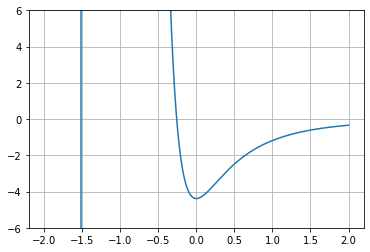

In [542]:
x = np.linspace(-2,2,1000)
plt.ylim(-6,6)
plt.plot(x, lj(x))
plt.grid()

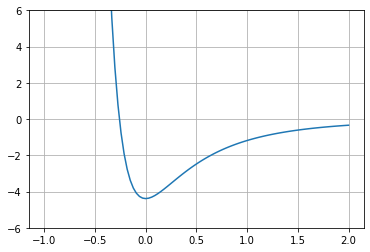

In [543]:
# @jit    
# def lj(distances, radii,epsilon=1):
#     #inverse_distances = 1/distances
#     lennard_jones = epsilon*( (2/distances)**6 - 4*(2/distances)**3)
#     #lennard_jones = 4*epsilon*( (1/distances)**12 - (1/distances)**6)
#     #lennard_jones = 2*epsilon*( inverse_distances**12 - 2*inverse_distances**6)
#     #lennard_jones = 4*epsilon*( (2/distances)**6 - 2*(2/distances)**3)
#     return lennard_jones

@jit 
def get_bond_lengths(pos, bonds):
    return np.linalg.norm(pos[bonds][:,0,:]-pos[bonds][:,1,:], axis=1)

@jit
def loss(p, a, b, c, radii):
    all_distances = E_fn(a, p)-radii
    distance_term = lj(all_distances).sum()
#    volume_term = vmake_vol(p[c]).sum()
    bond_lengths = get_bond_lengths(p, b)*10
    bond_term = (bond_lengths-optimum_sidelength*4)**3
    
    return distance_term+bond_term.sum()

x = np.linspace(-1,2,100)
plt.ylim(-6,6)
plt.plot(x, lj(x))
plt.grid()

In [544]:
print(loss(points, atom_centres, allbonds,cells, radii))
gl = grad(loss)
print(gl(points, atom_centres, allbonds, cells, radii))

42190.812
[[-1.4359193   3.8964639   0.6396512 ]
 [ 1.2216142   1.5684702   0.01956305]
 [-4.216591   -5.04013    -1.5151861 ]
 ...
 [-1.834238    3.427125    0.10229374]
 [-1.8411808   3.436951    0.00527873]
 [-1.898427    3.2459502   0.04123189]]


In [545]:
#copy so we don't change the original starting points, making it easier to do repeats
positions = points.copy()

avg_sq_grad = np.zeros_like(positions)
gamma=0.9
eps=1e-8
mass = 1
lr = 0.01 #step size

for _ in tqdm_notebook(range(500)):
    g = gl(positions, atom_centres, allbonds, cells, radii)
    avg_sq_grad = avg_sq_grad * gamma + g**2 * (1. - gamma)
    newpos = positions - lr * g / np.sqrt(avg_sq_grad + eps)    
    print(np.max(np.linalg.norm(positions-newpos, axis=1)))
    positions=newpos
    

<ipython-input-545-f580380ca5b0>:10: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



0.054772444
0.054767903
0.054718792
0.054662533
0.054600116
0.054645445
0.054333657
0.054067582
0.053243626
0.051348202
0.048718784
0.0413147
0.04040908
0.03949574
0.034425303
0.039640505
0.03730655
0.036298145
0.03604709
0.03557701
0.03995799
0.036634594
0.03821579
0.036055766
0.034691364
0.03569496
0.03582953
0.035376158
0.03662745
0.039518762
0.038060453
0.03514324
0.03704353
0.03926252
0.03858562
0.034449276
0.042878885
0.038881365
0.036279745
0.034355536
0.033503093
0.03389994
0.033060644
0.038746838
0.03582615
0.034158617
0.03633935
0.03353171
0.034920946
0.03314409
0.036018115
0.03518724
0.034469064
0.035683334
0.036817234
0.03461348
0.039248582
0.034495898
0.033960547
0.037268672
0.035782576
0.03487758
0.034312055
0.032528862
0.036515865
0.033908807
0.03525596
0.037679628
0.033884346
0.03590679
0.034418505
0.032515243
0.035889845
0.032330427
0.032156583
0.031198319
0.031431593
0.03114852
0.03331358
0.033628386
0.035684075
0.03820716
0.036510896
0.033198323
0.03540683
0.03948334

In [546]:
plotly_scatter([np.vstack([golden_spiral(270,1.4)+i for i in atom_centres]), points, positions], [10,5,3])
#plotly_scatter([atom_centres, points], [10,5,3])


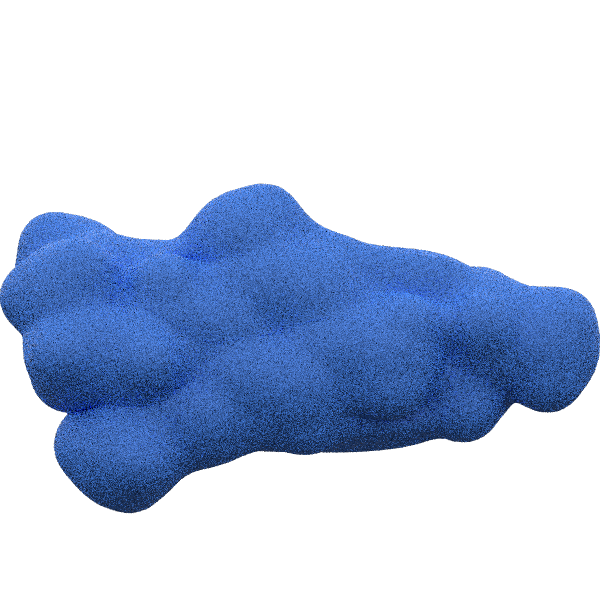

In [547]:
import fresnel
scene1 = fresnel.Scene()
geom = fresnel.geometry.Mesh(scene1,vertices=positions[cells].reshape(-1,3),N=1)
geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), roughness=0.6)
scene1.camera = fresnel.camera.fit(scene1,view='front', margin=0)
scene1.lights = fresnel.light.cloudy()
fresnel.pathtrace(scene1, samples=10, h=600, w=600)

In [513]:
import igl

In [514]:
lv, lf = igl.loop(onp.array(positions), onp.array(cells))
lv, lf = igl.loop(lv, lf)

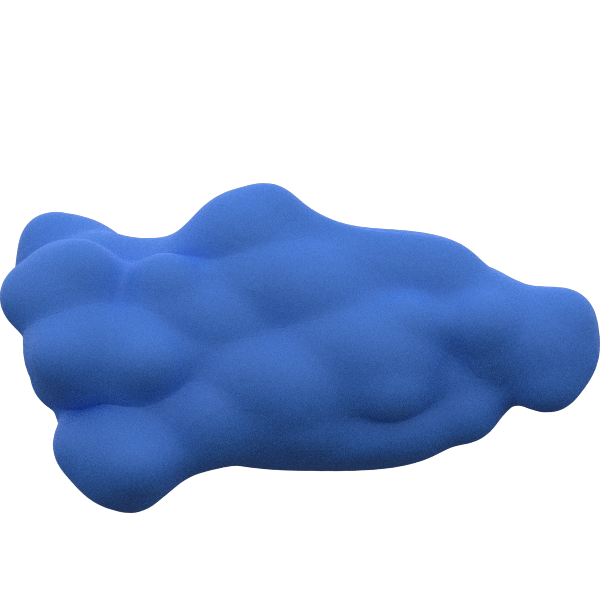

In [548]:
scene1 = fresnel.Scene()
geom = fresnel.geometry.Mesh(scene1,vertices=lv[lf].reshape(-1,3),N=1)
geom.material = fresnel.material.Material(color=fresnel.color.linear([0.25,0.5,0.9]), roughness=0.6)
scene1.camera = fresnel.camera.fit(scene1,view='front', margin=0)
scene1.lights = fresnel.light.cloudy()
fresnel.pathtrace(scene1, samples=200, h=600, w=600)